<a href="https://colab.research.google.com/github/delfinapirroncello/Coupons/blob/main/Projct_Data1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import pandas as pd #análisis de datos
import numpy as np #facilidades matemáticas
import statistics #funciones estadísticas
import matplotlib.pyplot as plt #plot/gráficos
import plotly.express as px #varias figuras en un solo plot
import seaborn as sns #visuales


In [4]:
a = [5, 10, 2]
b = [2, 4, 3]
dot = 0 #para encontrar el punto medio
for a,b in zip(a,b):
  dot = dot + a*b
  print('Mi producto punto es:', dot)

Mi producto punto es: 10
Mi producto punto es: 50
Mi producto punto es: 56


In [5]:
a = [5, 10, 2]
b = [2, 4, 3] 
dot = np.dot(a,b) #la libreria numpy sirve porque ya lo sabe hacer entonces la llamo y lo hace 
print('Mi producto punto es:', dot)

Mi producto punto es: 56


DATA FRAME


In [6]:
a = ['chicle', 'queso', 'aguacate']
b = [20,30,40]

miprimerdataframe = pd.DataFrame(zip(a,b), columns = ['Producto', 'Precio'])

In [7]:
miprimerdataframe

,Producto,Precio
0,chicle,20
1,queso,30
2,aguacate,40


In [8]:
# https://drive.google.com/file/d/1wgLwewxyl2bQVh5Wxg4yix47eO4d6O1K/view?usp=sharing

url = "https://drive.google.com/uc?id="
data = '1wgLwewxyl2bQVh5Wxg4yix47eO4d6O1K'
df_psy = pd.read_csv(url+data) #le estoy diciendo que utilice url y el archivo q estamos solicitandole


In [9]:
df_psy

,Person,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
0,1,16,2.0,Never,White,Hetero,Other,US,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0
1,2,16,5.0,Never,White,New Types,Christian Other,GB,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0
2,3,17,1.0,Never,White,Homo,Christian,US,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0
3,4,13,3.0,Never,Other,New Types,Christian,US,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0
4,5,19,3.0,Never,White,Hetero,Muslim,ES,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39774,39772,21,4.0,Never,Asian,New Types,Muslim,MY,4.0,5.0,7.0,6.0,4.0,7.0,4.0,3.0,3.0,4.0,4.0
39775,39773,48,NaN,Married,NaN,Hetero,Christian Other,NaN,6.0,7.0,5.0,3.0,6.0,1.0,5.0,2.0,2.0,1.0,2.0
39776,39774,20,NaN,Never,NaN,Hetero,Protestant,NaN,1.0,5.0,7.0,5.0,3.0,5.0,3.0,3.0,2.0,4.0,4.0
39777,39775,26,NaN,Never,NaN,Hetero,Muslim,NaN,6.0,3.0,5.0,3.0,5.0,5.0,1.0,2.0,2.0,1.0,3.0


Plan de limpieza

1) Drop de Person

2) Duplicados

3) Null

4) Datos atípicos

5) Variable categóticas



In [10]:
df_psy = df_psy.drop(df_psy.columns[0], axis = 1) #eliminar la columna 0 del eje horizontal
df_psy

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
0,16,2.0,Never,White,Hetero,Other,US,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0
1,16,5.0,Never,White,New Types,Christian Other,GB,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0
2,17,1.0,Never,White,Homo,Christian,US,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0
3,13,3.0,Never,Other,New Types,Christian,US,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0
4,19,3.0,Never,White,Hetero,Muslim,ES,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39774,21,4.0,Never,Asian,New Types,Muslim,MY,4.0,5.0,7.0,6.0,4.0,7.0,4.0,3.0,3.0,4.0,4.0
39775,48,NaN,Married,NaN,Hetero,Christian Other,NaN,6.0,7.0,5.0,3.0,6.0,1.0,5.0,2.0,2.0,1.0,2.0
39776,20,NaN,Never,NaN,Hetero,Protestant,NaN,1.0,5.0,7.0,5.0,3.0,5.0,3.0,3.0,2.0,4.0,4.0
39777,26,NaN,Never,NaN,Hetero,Muslim,NaN,6.0,3.0,5.0,3.0,5.0,5.0,1.0,2.0,2.0,1.0,3.0


In [11]:
# Duplicados
dupli = sum(df_psy.duplicated())
dupli  #una sola fila repetida

1

In [12]:
# Sacar un porcentaje del duplicado
dupli = sum(df_psy.duplicated())
print(dupli/len(df_psy.index)*100)

0.002513889238040172


In [13]:
df_psy = df_psy.drop_duplicates() #Lo va a eliminar

In [14]:
#Comprobamos que lo elimino
dupli = sum(df_psy.duplicated())
dupli

0

In [15]:
#Null
#Traemos toda la información del dataframe para que me muestre que tipo de dato es y cuantos null tenemos 
display(df_psy.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39778 entries, 0 to 39777
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          39778 non-null  int64  
 1   familysize   39775 non-null  float64
 2   married      39778 non-null  object 
 3   race         39775 non-null  object 
 4   orientation  39777 non-null  object 
 5   religion     39776 non-null  object 
 6   country      39773 non-null  object 
 7   Q1           39776 non-null  float64
 8   Q2           39773 non-null  float64
 9   Q3           39774 non-null  float64
 10  Q4           39776 non-null  float64
 11  Q5           39774 non-null  float64
 12  Q6           39773 non-null  float64
 13  Q7           39774 non-null  float64
 14  Q8           39773 non-null  float64
 15  Q9           39774 non-null  float64
 16  Q10          39775 non-null  float64
 17  Q11          39776 non-null  float64
dtypes: float64(12), int64(1), object(5)
memory usa

None

In [16]:
null = df_psy[df_psy.isna().any(axis=1)] #le pido que me traiga los valores nulos
null

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
90,15,3.0,Never,White,New Types,NaN,US,1.0,NaN,NaN,6.0,NaN,6.0,NaN,NaN,NaN,4.0,4.0
137,20,7.0,Never,White,Hetero,Atheist,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
153,24,2.0,Never,Asian,Homo,Hindu,CA,5.0,NaN,4.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
225,19,2.0,Never,Other,NaN,NaN,US,2.0,NaN,NaN,6.0,NaN,NaN,3.0,NaN,2.0,NaN,3.0
257,15,1.0,Never,Black,Homo,Jewish,CA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,2.0
6442,18,2.0,Never,White,Hetero,Muslim,NaN,4.0,4.0,1.0,4.0,5.0,5.0,6.0,1.0,1.0,1.0,1.0
35215,23,3.0,Never,White,New Types,Muslim,NaN,5.0,7.0,5.0,5.0,6.0,1.0,5.0,2.0,1.0,2.0,2.0
35721,27,1.0,Never,Native USA,Hetero,Muslim,US,1.0,3.0,5.0,7.0,5.0,NaN,2.0,2.0,2.0,3.0,3.0
39775,48,NaN,Married,NaN,Hetero,Christian Other,NaN,6.0,7.0,5.0,3.0,6.0,1.0,5.0,2.0,2.0,1.0,2.0
39776,20,NaN,Never,NaN,Hetero,Protestant,NaN,1.0,5.0,7.0,5.0,3.0,5.0,3.0,3.0,2.0,4.0,4.0


In [17]:
#Eliminamos de los nulos a la 35721 que vamos a predecir el valor ya que en esa no falta un null importante(hay que proteger ese valor)
df_psy['Q6'][35721] = 30

<ipython-input-17-b54f01662ad1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_psy['Q6'][35721] = 30


In [18]:
null = df_psy[df_psy.isna().any(axis=1)] #le pido que me traiga todos los nulos para corroborar que la 35721 no este 
null

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
90,15,3.0,Never,White,New Types,NaN,US,1.0,NaN,NaN,6.0,NaN,6.0,NaN,NaN,NaN,4.0,4.0
137,20,7.0,Never,White,Hetero,Atheist,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
153,24,2.0,Never,Asian,Homo,Hindu,CA,5.0,NaN,4.0,5.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
225,19,2.0,Never,Other,NaN,NaN,US,2.0,NaN,NaN,6.0,NaN,NaN,3.0,NaN,2.0,NaN,3.0
257,15,1.0,Never,Black,Homo,Jewish,CA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,2.0
6442,18,2.0,Never,White,Hetero,Muslim,NaN,4.0,4.0,1.0,4.0,5.0,5.0,6.0,1.0,1.0,1.0,1.0
35215,23,3.0,Never,White,New Types,Muslim,NaN,5.0,7.0,5.0,5.0,6.0,1.0,5.0,2.0,1.0,2.0,2.0
39775,48,NaN,Married,NaN,Hetero,Christian Other,NaN,6.0,7.0,5.0,3.0,6.0,1.0,5.0,2.0,2.0,1.0,2.0
39776,20,NaN,Never,NaN,Hetero,Protestant,NaN,1.0,5.0,7.0,5.0,3.0,5.0,3.0,3.0,2.0,4.0,4.0
39777,26,NaN,Never,NaN,Hetero,Muslim,NaN,6.0,3.0,5.0,3.0,5.0,5.0,1.0,2.0,2.0,1.0,3.0


In [19]:
#Elimino el resto de los nulos del dataframe
df_psy = df_psy.dropna()

In [20]:
null = df_psy[df_psy.isna().any(axis=1)] #le pido que me traiga todos los nulos para corroborar que no esten mas 
null  

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11


In [21]:
#Para predecir el valor que me falta de la 35721
df_psy['Q6'][35721] = np.nan #para que nos ponga el valor nan hay que pedirle np numpa que nos ponga el valor

In [22]:
null = df_psy[df_psy.isna().any(axis=1)] #el nulo
null

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
35721,27,1.0,Never,Native USA,Hetero,Muslim,US,1.0,3.0,5.0,7.0,5.0,NaN,2.0,2.0,2.0,3.0,3.0


In [23]:
"Comenzamos a predecir"
imputar = df_psy[['Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q8', 'Q9', 'Q10', 'Q11']]
imputar

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
0,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0
1,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0
2,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0
3,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0
4,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...
39770,1.0,5.0,7.0,6.0,6.0,4.0,3.0,4.0,4.0,3.0,4.0
39771,6.0,6.0,7.0,4.0,6.0,5.0,5.0,2.0,1.0,2.0,2.0
39772,6.0,4.0,5.0,3.0,5.0,2.0,5.0,3.0,2.0,2.0,4.0
39773,2.0,3.0,5.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,4.0


In [24]:
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values= np.nan, strategy = 'mean')  #va a utilizar la media de esos valores y me va a poner ese valor
imp.fit(imputar)

SimpleImputer()

SimpleImputer()

In [25]:
imputar = pd.DataFrame(imp.transform(imputar), columns = ['Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6', 'Q7', 'Q8', 'Q9', 'Q10', 'Q11']) #con eso que obtuvo va a construirlo el DataFrame
imputar #el dataframe con el valor ya predecido

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
0,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0
1,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0
2,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0
3,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0
4,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...
39763,1.0,5.0,7.0,6.0,6.0,4.0,3.0,4.0,4.0,3.0,4.0
39764,6.0,6.0,7.0,4.0,6.0,5.0,5.0,2.0,1.0,2.0,2.0
39765,6.0,4.0,5.0,3.0,5.0,2.0,5.0,3.0,2.0,2.0,4.0
39766,2.0,3.0,5.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,4.0


In [26]:
null = imputar[imputar.isna().any(axis=1)] #verificar el nulo
null #me dice que no tiene ningun dato null

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11


In [27]:
imputar['Q6'][35721] #verificar que valor puso

3.0

In [28]:
df_psy['Q6'][[35721]] = imputar['Q6'][35721] #le agrego el 3.0

<ipython-input-28-c5af51bac13b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_psy['Q6'][[35721]] = imputar['Q6'][35721] #le agrego el 3.0


In [29]:
display(df_psy.info())  #reviso que pasa con nuestros valores -- tenemos el mismo valor en todas las columnas, significa que no tenemos mas nulos

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39768 entries, 0 to 39774
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   age          39768 non-null  int64  
 1   familysize   39768 non-null  float64
 2   married      39768 non-null  object 
 3   race         39768 non-null  object 
 4   orientation  39768 non-null  object 
 5   religion     39768 non-null  object 
 6   country      39768 non-null  object 
 7   Q1           39768 non-null  float64
 8   Q2           39768 non-null  float64
 9   Q3           39768 non-null  float64
 10  Q4           39768 non-null  float64
 11  Q5           39768 non-null  float64
 12  Q6           39768 non-null  float64
 13  Q7           39768 non-null  float64
 14  Q8           39768 non-null  float64
 15  Q9           39768 non-null  float64
 16  Q10          39768 non-null  float64
 17  Q11          39768 non-null  float64
dtypes: float64(12), int64(1), object(5)
memory usa

None

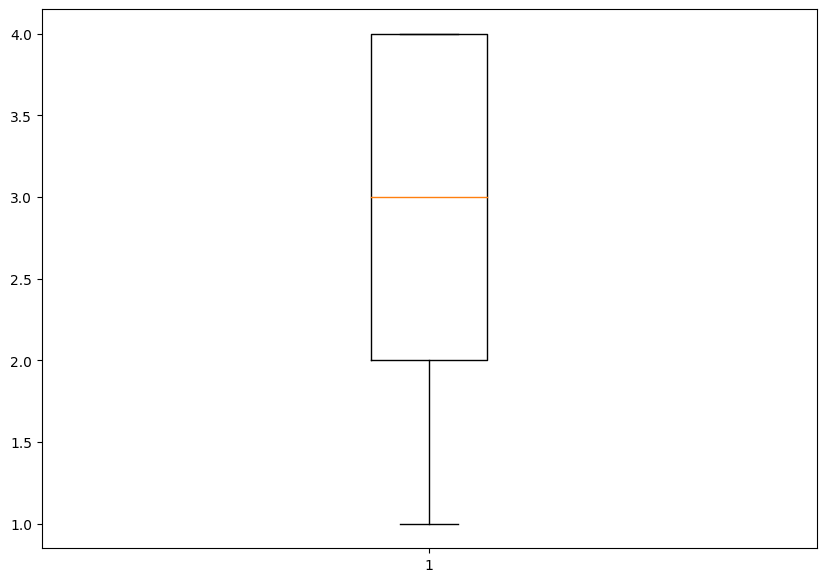

In [30]:
#Datos Atípicos 
var = df_psy['Q8']
fig = plt.figure(figsize = (10,7))  #forma correcta de graficar
plt.boxplot(var)  #le vamos a pedir que nos grafique nuestra variable
plt.show() #mostrar
px.box(var, points= 'all') #mas ordenado donde va a poder tener los valores

In [31]:
#METODO RAPIDO PARA ANALIZAR 
num = df_psy.drop(['married', 'orientation', 'religion', 'race', 'country'], axis = 1)
fig = px.box(num.melt(), y = "value", facet_col = 'variable', boxmode = 'overlay', color = 'variable')
fig.update_yaxes(matches= None)  #veo los datos atipicos como por ej alguien de 223 años etc

In [32]:
maxage = num['age'].max() #cual es la edad maxima
maxage

1998

In [33]:
Maxage = num[num['age']>100] #todas las personas +100
Maxage

,age,familysize,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
5342,223,4.0,7.0,6.0,3.0,2.0,1.0,2.0,6.0,2.0,1.0,1.0,1.0
10233,1996,1.0,5.0,7.0,7.0,7.0,5.0,3.0,5.0,4.0,4.0,3.0,4.0
14238,117,6.0,3.0,1.0,7.0,6.0,3.0,6.0,2.0,4.0,3.0,4.0,3.0
21385,1998,6.0,1.0,1.0,6.0,7.0,1.0,1.0,1.0,2.0,1.0,2.0,2.0
24900,115,5.0,5.0,3.0,6.0,6.0,5.0,6.0,2.0,3.0,2.0,1.0,2.0
30029,1993,2.0,4.0,7.0,7.0,7.0,7.0,6.0,2.0,4.0,4.0,3.0,4.0
33732,1991,4.0,2.0,7.0,7.0,5.0,6.0,6.0,2.0,3.0,3.0,3.0,4.0


In [34]:
df_psy = df_psy[df_psy['age']<100] # elimino a todos los mayores a 100 años
df_psy 

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
0,16,2.0,Never,White,Hetero,Other,US,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0
1,16,5.0,Never,White,New Types,Christian Other,GB,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0
2,17,1.0,Never,White,Homo,Christian,US,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0
3,13,3.0,Never,Other,New Types,Christian,US,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0
4,19,3.0,Never,White,Hetero,Muslim,ES,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39770,19,1.0,Never,White,Hetero,Muslim,US,1.0,5.0,7.0,6.0,6.0,4.0,3.0,4.0,4.0,3.0,4.0
39771,27,4.0,Never,Asian,Hetero,Christian,PK,6.0,6.0,7.0,4.0,6.0,5.0,5.0,2.0,1.0,2.0,2.0
39772,16,2.0,Never,Arab,Hetero,Agnostic,EG,6.0,4.0,5.0,3.0,5.0,2.0,5.0,3.0,2.0,2.0,4.0
39773,16,4.0,Never,Asian,Asexual,Atheist,MY,2.0,3.0,5.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,4.0


In [35]:
df_psy = df_psy[df_psy['Q4']< 8] # elimino a todos menores a 8/5 que son datos atipicos
df_psy = df_psy[df_psy['Q5']< 8]
df_psy = df_psy[df_psy['Q11']< 5]
df_psy 

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
0,16,2.0,Never,White,Hetero,Other,US,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0
1,16,5.0,Never,White,New Types,Christian Other,GB,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0
2,17,1.0,Never,White,Homo,Christian,US,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0
3,13,3.0,Never,Other,New Types,Christian,US,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0
4,19,3.0,Never,White,Hetero,Muslim,ES,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39770,19,1.0,Never,White,Hetero,Muslim,US,1.0,5.0,7.0,6.0,6.0,4.0,3.0,4.0,4.0,3.0,4.0
39771,27,4.0,Never,Asian,Hetero,Christian,PK,6.0,6.0,7.0,4.0,6.0,5.0,5.0,2.0,1.0,2.0,2.0
39772,16,2.0,Never,Arab,Hetero,Agnostic,EG,6.0,4.0,5.0,3.0,5.0,2.0,5.0,3.0,2.0,2.0,4.0
39773,16,4.0,Never,Asian,Asexual,Atheist,MY,2.0,3.0,5.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,4.0


In [36]:
#analizo como quedo luego de eliminar los datos atipicos 
num = df_psy.drop(['married', 'orientation', 'religion', 'race', 'country'], axis = 1)
fig = px.box(num.melt(), y = "value", facet_col = 'variable', boxmode = 'overlay', color = 'variable')
fig.update_yaxes(matches= None)  

In [37]:
#pido que me muestre los valores unicos 
df_psy.married.unique()

array(['Never', 'Previously', 'Married', 'Second', 'FALSE'], dtype=object)

In [38]:
df_psy.orientation.unique()

array(['Hetero', 'New Types', 'Homo', 'Bi', 'Asexual', 'FALSE'],
      dtype=object)

In [39]:
df_psy.religion.unique()

array(['Other', 'Christian Other', 'Christian', 'Muslim', 'Atheist',
       'Protestant', 'Agnostic', 'Hindu', 'Buddhist', 'Mormon', 'Sikh',
       'Jewish', 'FALSE'], dtype=object)

In [40]:
df_psy.race.unique()

array(['White', 'Other', 'Asian', 'Black', 'Arab', 'Native USA',
       'Indigenous'], dtype=object)

In [41]:
false = df_psy[df_psy['married']== 'FALSE']
false

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
39401,43,3.0,FALSE,Other,FALSE,FALSE,ID,2.0,7.0,5.0,5.0,7.0,1.0,3.0,1.0,1.0,2.0,1.0


In [42]:
#eliminamos el false 
df_psy = df_psy[df_psy['religion'] != 'FALSE']

In [43]:
#VERIFICAMOS 
df_psy

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11
0,16,2.0,Never,White,Hetero,Other,US,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0
1,16,5.0,Never,White,New Types,Christian Other,GB,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0
2,17,1.0,Never,White,Homo,Christian,US,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0
3,13,3.0,Never,Other,New Types,Christian,US,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0
4,19,3.0,Never,White,Hetero,Muslim,ES,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39770,19,1.0,Never,White,Hetero,Muslim,US,1.0,5.0,7.0,6.0,6.0,4.0,3.0,4.0,4.0,3.0,4.0
39771,27,4.0,Never,Asian,Hetero,Christian,PK,6.0,6.0,7.0,4.0,6.0,5.0,5.0,2.0,1.0,2.0,2.0
39772,16,2.0,Never,Arab,Hetero,Agnostic,EG,6.0,4.0,5.0,3.0,5.0,2.0,5.0,3.0,2.0,2.0,4.0
39773,16,4.0,Never,Asian,Asexual,Atheist,MY,2.0,3.0,5.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,4.0


In [44]:
#vamos a hacer un diccionario 
matrimonio = {
    'Never' : 1,
    'Previously' : 2,
    'Married' : 3,
    'Second' : 4
              }

df_psy['Matrimonio'] = df_psy['married'].map(matrimonio)

sexualidad = {
    'Hetero' : 1,
    'New Types' : 2,
    'Homo' : 3,
    'Bi' : 4,
    'Asexual' : 5
              }

df_psy['Orientacion'] = df_psy['orientation'].map(sexualidad)

creencia = {
    'Other' : 1,
    'Christian Other' : 2,
    'Christian' : 3,
    'Muslim' : 4,
    'Atheist' : 5,
    'Protestant' : 6,
    'Agnostic' : 7,
    'Hindu' : 8,
    'Buddhist' : 9,
    'Mormon' : 10,
    'Sikh' : 11,
    'Jewish' : 12
              }

df_psy['Religion'] = df_psy['religion'].map(creencia)


Raz = {
    'White' : 1,
    'Other' : 2,
    'Asian' : 3,
    'Black' : 4,
    'Arab' : 5,
    'Native USA' : 6,
    'Indigenous' : 7
              }

df_psy['Raza'] = df_psy['race'].map(Raz)


<ipython-input-44-9864c1bf453a>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-44-9864c1bf453a>:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-44-9864c1bf453a>:36: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-44-9864c

In [45]:
df_psy

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,...,Q6,Q7,Q8,Q9,Q10,Q11,Matrimonio,Orientacion,Religion,Raza
0,16,2.0,Never,White,Hetero,Other,US,1.0,7.0,7.0,...,5.0,1.0,4.0,2.0,4.0,4.0,1,1,1,1
1,16,5.0,Never,White,New Types,Christian Other,GB,6.0,4.0,7.0,...,7.0,1.0,4.0,2.0,4.0,4.0,1,2,2,1
2,17,1.0,Never,White,Homo,Christian,US,2.0,2.0,2.0,...,5.0,3.0,3.0,4.0,3.0,4.0,1,3,3,1
3,13,3.0,Never,Other,New Types,Christian,US,1.0,7.0,4.0,...,1.0,6.0,2.0,2.0,2.0,1.0,1,2,3,2
4,19,3.0,Never,White,Hetero,Muslim,ES,2.0,3.0,6.0,...,6.0,3.0,2.0,3.0,4.0,4.0,1,1,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39770,19,1.0,Never,White,Hetero,Muslim,US,1.0,5.0,7.0,...,4.0,3.0,4.0,4.0,3.0,4.0,1,1,4,1
39771,27,4.0,Never,Asian,Hetero,Christian,PK,6.0,6.0,7.0,...,5.0,5.0,2.0,1.0,2.0,2.0,1,1,3,3
39772,16,2.0,Never,Arab,Hetero,Agnostic,EG,6.0,4.0,5.0,...,2.0,5.0,3.0,2.0,2.0,4.0,1,1,7,5
39773,16,4.0,Never,Asian,Asexual,Atheist,MY,2.0,3.0,5.0,...,3.0,3.0,2.0,3.0,3.0,4.0,1,5,5,3


In [46]:
all = df_psy
allnumeric = df_psy.drop(['married', 'orientation', 'religion', 'race', 'country'], axis = 1)  #hacer los valores numericos
all

,age,familysize,married,race,orientation,religion,country,Q1,Q2,Q3,...,Q6,Q7,Q8,Q9,Q10,Q11,Matrimonio,Orientacion,Religion,Raza
0,16,2.0,Never,White,Hetero,Other,US,1.0,7.0,7.0,...,5.0,1.0,4.0,2.0,4.0,4.0,1,1,1,1
1,16,5.0,Never,White,New Types,Christian Other,GB,6.0,4.0,7.0,...,7.0,1.0,4.0,2.0,4.0,4.0,1,2,2,1
2,17,1.0,Never,White,Homo,Christian,US,2.0,2.0,2.0,...,5.0,3.0,3.0,4.0,3.0,4.0,1,3,3,1
3,13,3.0,Never,Other,New Types,Christian,US,1.0,7.0,4.0,...,1.0,6.0,2.0,2.0,2.0,1.0,1,2,3,2
4,19,3.0,Never,White,Hetero,Muslim,ES,2.0,3.0,6.0,...,6.0,3.0,2.0,3.0,4.0,4.0,1,1,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39770,19,1.0,Never,White,Hetero,Muslim,US,1.0,5.0,7.0,...,4.0,3.0,4.0,4.0,3.0,4.0,1,1,4,1
39771,27,4.0,Never,Asian,Hetero,Christian,PK,6.0,6.0,7.0,...,5.0,5.0,2.0,1.0,2.0,2.0,1,1,3,3
39772,16,2.0,Never,Arab,Hetero,Agnostic,EG,6.0,4.0,5.0,...,2.0,5.0,3.0,2.0,2.0,4.0,1,1,7,5
39773,16,4.0,Never,Asian,Asexual,Atheist,MY,2.0,3.0,5.0,...,3.0,3.0,2.0,3.0,3.0,4.0,1,5,5,3


In [47]:
allnumeric

,age,familysize,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Matrimonio,Orientacion,Religion,Raza
0,16,2.0,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0,1,1,1,1
1,16,5.0,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0,1,2,2,1
2,17,1.0,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0,1,3,3,1
3,13,3.0,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0,1,2,3,2
4,19,3.0,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0,1,1,4,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39770,19,1.0,1.0,5.0,7.0,6.0,6.0,4.0,3.0,4.0,4.0,3.0,4.0,1,1,4,1
39771,27,4.0,6.0,6.0,7.0,4.0,6.0,5.0,5.0,2.0,1.0,2.0,2.0,1,1,3,3
39772,16,2.0,6.0,4.0,5.0,3.0,5.0,2.0,5.0,3.0,2.0,2.0,4.0,1,1,7,5
39773,16,4.0,2.0,3.0,5.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,4.0,1,5,5,3


EDA |

In [48]:
#VALOR QUE MAS SE REPITE
M = all ['married'].mode()
O = all ['orientation'].mode()
R = all ['religion'].mode()
Z = all ['race'].mode()

Z

0    Asian
Name: race, dtype: object

In [49]:
campos = [M, O, R, Z]
moda = pd.DataFrame({
    'Casamiento' : campos[0],
    'Orientacion' : campos[1],
    'Religion' : campos[2],
    'Raza' : campos[3]
})  #todos los valores que mas se repiten
moda

,Casamiento,Orientacion,Religion,Raza
0,Never,Hetero,Muslim,Asian


In [50]:
all.loc[:, 'age'].mean() #calcular la media de todas las edades

23.39572905400307

In [51]:
allnumeric.describe() #resumen estadistico

,age,familysize,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Matrimonio,Orientacion,Religion,Raza
count,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000,39757.000000
mean,23.395729,3.499736,3.798425,4.757125,5.184596,4.863772,5.268431,4.297658,3.660311,2.619564,2.226199,2.480519,2.784642,1.261162,1.839827,4.278291,2.393314
std,8.548658,1.917671,1.881424,1.767918,1.795094,1.875892,1.606651,1.936820,1.811937,1.032095,1.038581,1.052359,1.073748,0.664362,1.258756,1.632446,0.965716
min,13.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,18.000000,2.000000,2.000000,4.000000,4.000000,4.000000,5.000000,3.000000,2.000000,2.000000,1.000000,2.000000,2.000000,1.000000,1.000000,4.000000,1.000000
50%,21.000000,3.000000,4.000000,5.000000,6.000000,5.000000,6.000000,5.000000,4.000000,3.000000,2.000000,2.000000,3.000000,1.000000,1.000000,4.000000,3.000000
75%,25.000000,4.000000,5.000000,6.000000,7.000000,6.000000,7.000000,6.000000,5.000000,4.000000,3.000000,3.000000,4.000000,1.000000,2.000000,5.000000,3.000000
max,79.000000,24.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,7.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,12.000000,7.000000


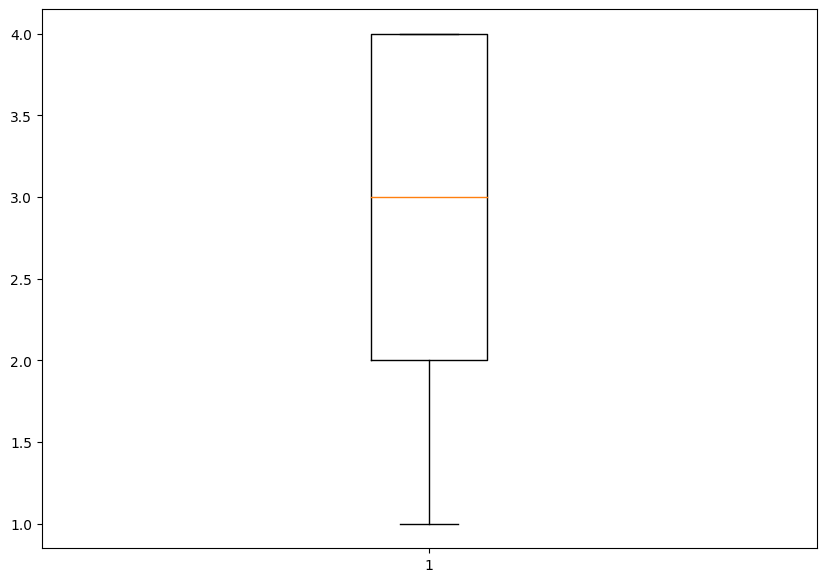

2.6195638503911263
1.0320951630178519


In [52]:
#visualizarlo de manera grafica
fig = plt.figure(figsize = (10, 7))
plt.boxplot(all['Q8'])
plt.show()
print(all['Q8'].mean())
print(all['Q8'].std())

<Axes: xlabel='age'>

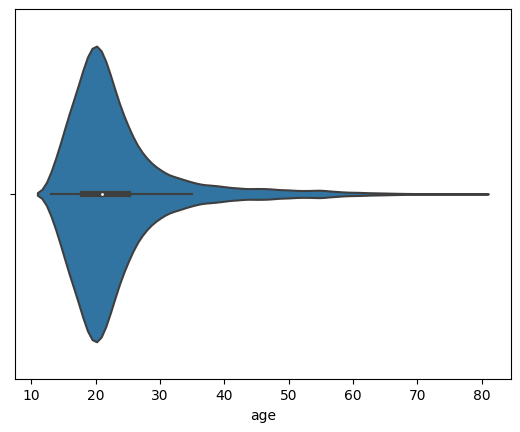

In [53]:
#GRAFICO UNIVARIADO
#grafico violin cantidad de personas  // veo la data de forma continua 
sns.violinplot(data = allnumeric, x = allnumeric.age) 

<Axes: xlabel='age'>

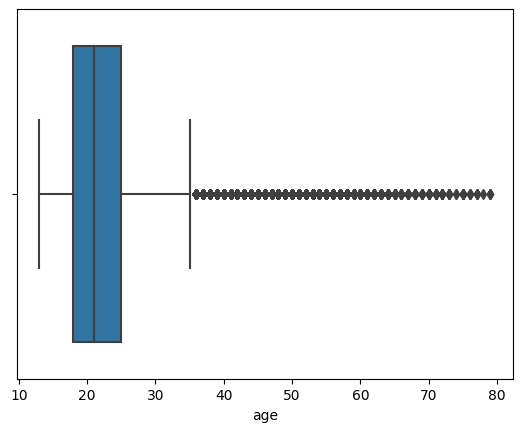

In [54]:
sns.boxplot(x = all.age) #veo la data de forma discreta 

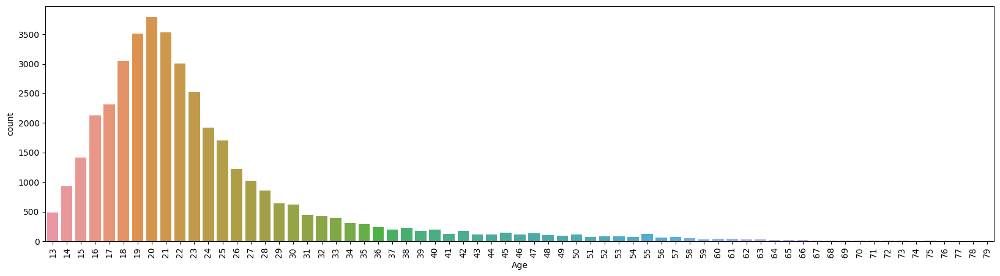

In [55]:
#de barras
plt.figure(figsize = (20,5))
sns.countplot(x = allnumeric ['age'])
plt.xlabel('Age')
plt.xticks(rotation =90)
plt.show()

<Axes: xlabel='age', ylabel='Count'>

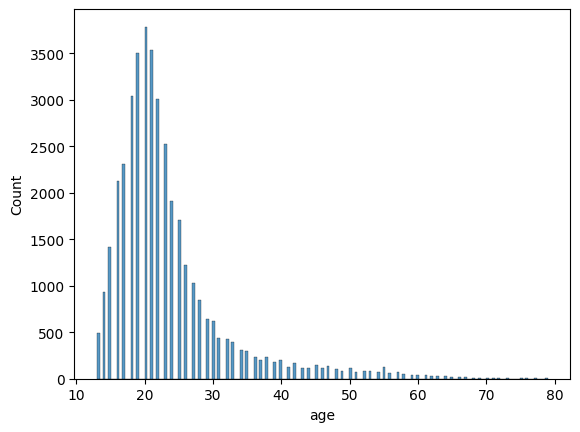

In [56]:
sns.histplot( x = allnumeric['age'] )

In [57]:
agess = allnumeric[allnumeric['age']>55] 
mayores = len(agess.index)
totalidad = len(allnumeric.index)
print(mayores/totalidad*100)  #calcular el porcentaje de mayores a 55 años (da 1,2%)

1.2802776869482104


In [58]:
agess = allnumeric[allnumeric['age']<35] 
mayores = len(agess.index)
totalidad = len(allnumeric.index)
print(mayores/totalidad*100)  #calcular el porcentaje de menores a 35 (da 91%)

91.1487285257942


Insight = de toda mi población dentro del análisis u 98% de las personas son menores a 55. El 91% de encuestados son menores a 35 años.

<Axes: xlabel='Q3'>

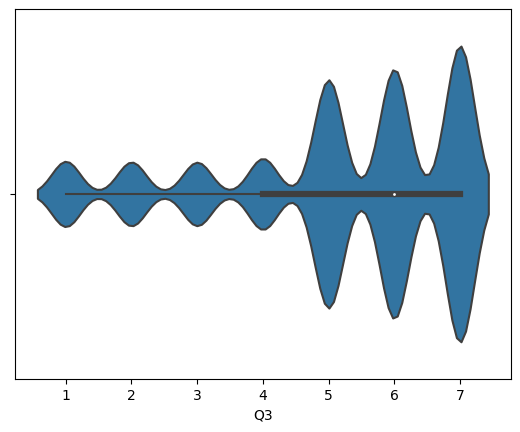

In [59]:
sns.violinplot(data = allnumeric, x = allnumeric.Q3) #la pregunta 3 habla de si la persona se siente ansiosa

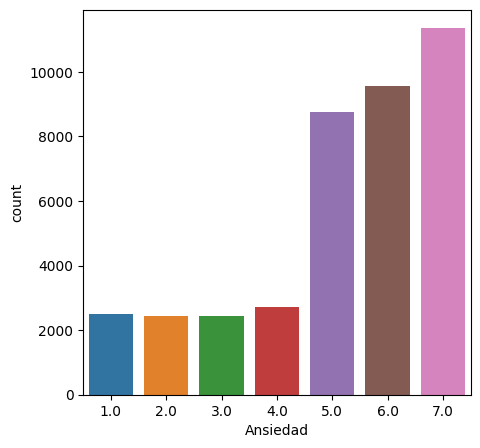

In [60]:
plt.figure(figsize = (5,5))
sns.countplot(x = allnumeric ['Q3'])
plt.xlabel('Ansiedad')
plt.show()

In [61]:
n = allnumeric['Q3'].value_counts() #contar los valores por cada una de las respuestas
count = pd.DataFrame(n)
count
altos = count.loc[7] + count.loc[6] + count.loc[5] #loc le pide que tome el indice 7
total = count['Q3'].sum()
altosprop = altos/total

solosiete = count.loc[7]/total

print("por encima de 5", altosprop*100) #*100 para que me lo calcule con porcentaje
print("valores en 7", solosiete*100)
print("Valores solo en 1", (count.loc[1]/total)*100)

por encima de 5 Q3    74.600699
dtype: float64
valores en 7 Q3    28.555978
Name: 7.0, dtype: float64
Valores solo en 1 Q3    6.295747
Name: 1.0, dtype: float64


Cuando se trata de ansiedad e irritación, el 74% de las personas responde con valores altos. Un 28% es el valor mas alto de ansiedad. El 6% de las personas se considera poro ansiosa.



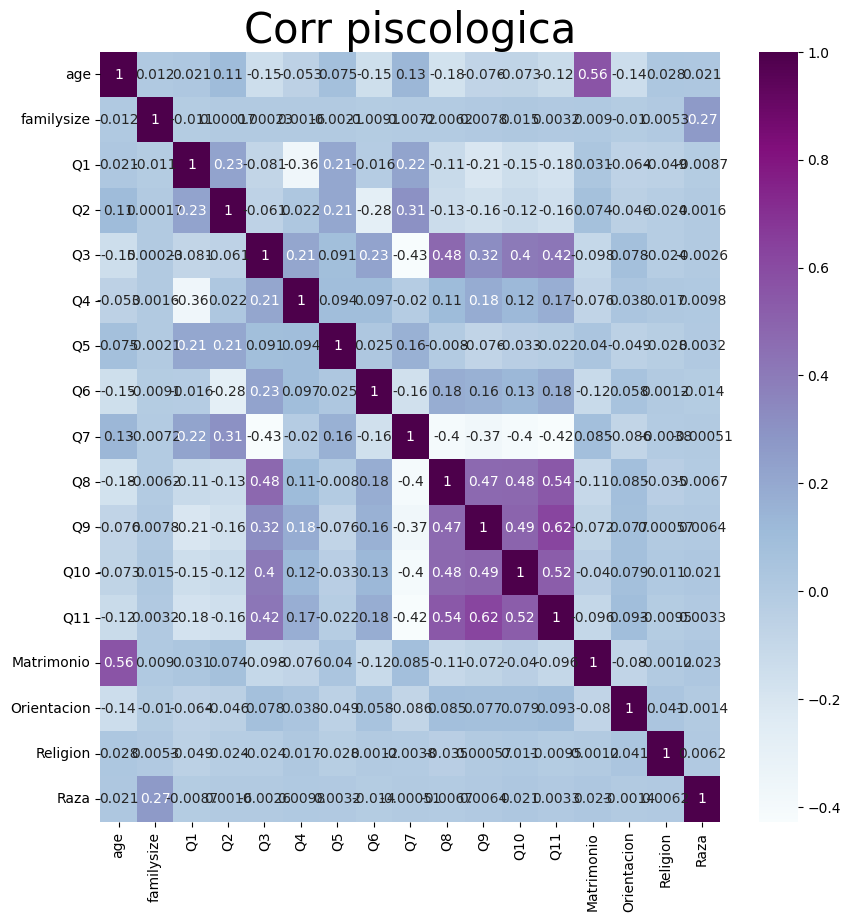

In [62]:
#ANALISIS BIVARIADO


#gráfico de correlaciones
plt.rcParams['figure.figsize'] = (10,10)
sns.heatmap(allnumeric.corr(), annot=True, cmap= 'BuPu')  #ver en las documentaciones los tipos que existen
plt.title('Corr piscologica', fontsize = 30)
plt.show()

Las personas que sienten emociones negativas o mayor exaltación tienen una correlación positiva con los sentimientos de tristeza o menos posibilidad de sentirse relajados/as. Cuanto mas tranquila se identifica una persona, menos indicadores de emociones tristes experimenta. 

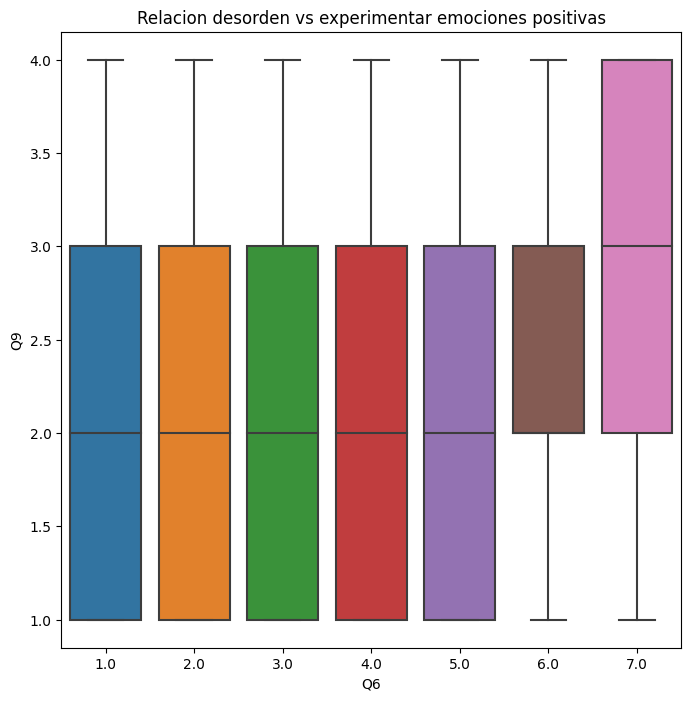

In [63]:
#comparacion de persona desorganizada en relacion con sentir emociones positivas o negativas
plt.rcParams['figure.figsize'] = (8,8)
sns.boxplot(x='Q6', y='Q9', data=allnumeric)
plt.title('Relacion desorden vs experimentar emociones positivas')
plt.show()

In [64]:
#Agrupar rango de edades 
allnumeric.loc[allnumeric['age'] >= 0, 'agegroup'] = '20'
allnumeric.loc[allnumeric['age'] >= 20, 'agegroup'] = '40'
allnumeric.loc[allnumeric['age'] >= 40, 'agegroup'] = '60'
allnumeric.loc[allnumeric['age'] >= 60, 'agegroup'] = '80'
allnumeric.loc[allnumeric['age'] >= 80, 'agegroup'] = '100'

In [65]:
allnumeric

,age,familysize,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Matrimonio,Orientacion,Religion,Raza,agegroup
0,16,2.0,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0,1,1,1,1,20
1,16,5.0,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0,1,2,2,1,20
2,17,1.0,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0,1,3,3,1,20
3,13,3.0,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0,1,2,3,2,20
4,19,3.0,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0,1,1,4,1,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39770,19,1.0,1.0,5.0,7.0,6.0,6.0,4.0,3.0,4.0,4.0,3.0,4.0,1,1,4,1,20
39771,27,4.0,6.0,6.0,7.0,4.0,6.0,5.0,5.0,2.0,1.0,2.0,2.0,1,1,3,3,40
39772,16,2.0,6.0,4.0,5.0,3.0,5.0,2.0,5.0,3.0,2.0,2.0,4.0,1,1,7,5,20
39773,16,4.0,2.0,3.0,5.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,4.0,1,5,5,3,20


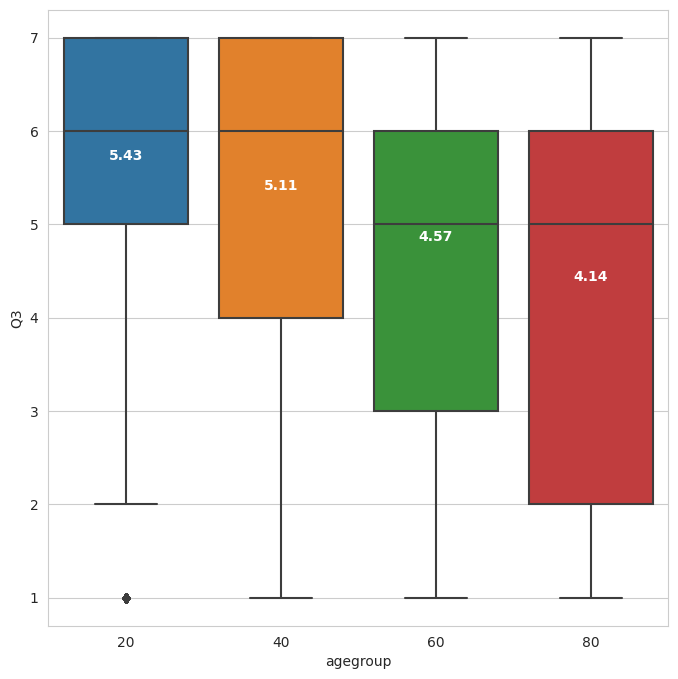

In [66]:
sns.set_style('whitegrid')
boxplot = sns.boxplot(x='agegroup', y='Q3', data=allnumeric)
mean = allnumeric.groupby(['agegroup'])['Q3'].mean().round(2)
vertical_offset = allnumeric['Q3'].mean() * 0.05
for i, group in enumerate(mean.index):
    boxplot.text(i, mean[group] + vertical_offset, mean[group], ha='center', size=10, color='w', weight='semibold')


A medida que envejecemos, el nivel de estrés con el que te percibes comienza a disminuir

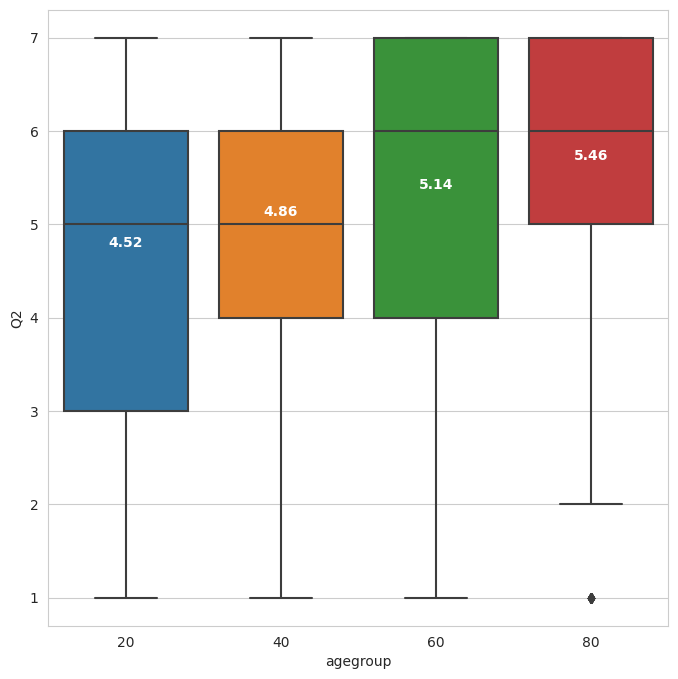

In [67]:
sns.set_style('whitegrid')
boxplot = sns.boxplot(x='agegroup', y='Q2', data=allnumeric)
mean = allnumeric.groupby(['agegroup'])['Q2'].mean().round(2)
vertical_offset = allnumeric['Q2'].mean() * 0.05
for i, group in enumerate(mean.index):
    boxplot.text(i, mean[group] + vertical_offset, mean[group], ha='center', size=10, color='w', weight='semibold')


A medida que envejeces, el nivel de disciplina con el que se percibe a sí mísmo comienza a aumentar.

In [68]:
#ANALISIS BIVARIADO-PRIFILER  - me da todos los datos del dataframe
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
from pandas_profiling import ProfileReport
profile = ProfileReport(all, title='My psy proj', html={'style':{'full_width':True}})
profile.to_notebook_iframe()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.6/22.6 MB 22.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 79.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 10.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.8/679.8 kB 47.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 442.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 28.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 75.5 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=345992 sha256=7b8bb77142ac2f59d0c6e6c5ee5200f484f639d44ac257cd29eddb5980dbd4

<ipython-input-68-a5550ead8201>:3: DeprecationWarning:

`import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [69]:
#ANALISIS MULTIVARIADO
#veremos como se maneja
#pairplot
#facegrid
#sns.pairplot
#sns.FaceGrid

In [68]:
sns.pairplot(allnumeric, hue='Q11')  #que me coloree desde la pregunta 11  
#en el eje y vamos a ver todas las preguntas, del costado derecho una etiqueta con los resultados del Q11

Error in callback <function flush_figures at 0x7f575562b940> (for post_execute):


KeyboardInterrupt: ignored

Las personas que no tienen capacidad de experimentar emociones positivas, sienten mayor ansiedad y mayor depresión


UTULIZAR 3 O MAS VARIABLES 

Status =

a) Q1 - Q3 - Q4 - Q6 = +8%

b) Q2 - Q5 - Q7 = -8%

c) Q8 - Q9 - Q10 - Q11 = +11%

In [69]:
#agrego la variable a, b, c y operador 
allnumeric['a'] = (allnumeric['Q1']*0.08) + (allnumeric['Q3']*0.08) + (allnumeric['Q4']*0.08) + (allnumeric['Q6']*0.08)
allnumeric['b'] = (allnumeric['Q2']*0.08) + (allnumeric['Q5']*0.08) + (allnumeric['Q7']*0.08)
allnumeric['c'] = (allnumeric['Q8']*0.11) + (allnumeric['Q9']*0.11) + (allnumeric['Q10']*0.11) + (allnumeric['Q11']*0.11)
allnumeric['Operador'] = allnumeric['a'] + allnumeric['c'] - allnumeric['b']
#agrego status
allnumeric.loc[allnumeric['Operador'] <= 1.50, 'Status'] = 1
allnumeric.loc[allnumeric['Operador'] > 1.50, 'Status'] = 0 

In [70]:
allnumeric = allnumeric.drop(['a','b','c','Operador'], axis = 1)
allnumeric

,age,familysize,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,Q11,Matrimonio,Orientacion,Religion,Raza,agegroup,Status
0,16,2.0,1.0,7.0,7.0,7.0,7.0,5.0,1.0,4.0,2.0,4.0,4.0,1,1,1,1,20,0.0
1,16,5.0,6.0,4.0,7.0,4.0,7.0,7.0,1.0,4.0,2.0,4.0,4.0,1,2,2,1,20,0.0
2,17,1.0,2.0,2.0,2.0,6.0,5.0,5.0,3.0,3.0,4.0,3.0,4.0,1,3,3,1,20,0.0
3,13,3.0,1.0,7.0,4.0,4.0,6.0,1.0,6.0,2.0,2.0,2.0,1.0,1,2,3,2,20,1.0
4,19,3.0,2.0,3.0,6.0,5.0,5.0,6.0,3.0,2.0,3.0,4.0,4.0,1,1,4,1,20,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39770,19,1.0,1.0,5.0,7.0,6.0,6.0,4.0,3.0,4.0,4.0,3.0,4.0,1,1,4,1,20,0.0
39771,27,4.0,6.0,6.0,7.0,4.0,6.0,5.0,5.0,2.0,1.0,2.0,2.0,1,1,3,3,40,1.0
39772,16,2.0,6.0,4.0,5.0,3.0,5.0,2.0,5.0,3.0,2.0,2.0,4.0,1,1,7,5,20,1.0
39773,16,4.0,2.0,3.0,5.0,5.0,5.0,3.0,3.0,2.0,3.0,3.0,4.0,1,5,5,3,20,0.0


In [71]:
sns.pairplot(allnumeric, hue = 'Status')

KeyboardInterrupt: ignored

Error in callback <function _draw_all_if_interactive at 0x7f57555b8700> (for post_execute):


KeyboardInterrupt: ignored

Error in callback <function flush_figures at 0x7f575562b940> (for post_execute):


KeyboardInterrupt: ignored

In [ ]:
sns.FacetGrid(allnumeric, hue='Q10', height = 6).map(plt.scatter, 'age', 'Orientacion').add_legend()
plt.show()

In [ ]:
sns.FacetGrid(allnumeric, hue='Status', height = 6).map(plt.scatter, 'age', 'Raza').add_legend()
plt.show()

In [70]:
#MACHINE LEARNING
#cargo las librerias
from sklearn import linear_model
from sklearn.metrics import r2_score

In [71]:
#Una vez que cargo las librerias, hago la funcion
regr = linear_model.LinearRegression() #pedimos que haga la regresion lineal
regresion = allnumeric[['Matrimonio', 'Orientacion', 'Q3', 'Q8', 'Q9', 'Q10', 'Q11']] #con cuales vamos a hacer el procedimiento
regresion

,Matrimonio,Orientacion,Q3,Q8,Q9,Q10,Q11
0,1,1,7.0,4.0,2.0,4.0,4.0
1,1,2,7.0,4.0,2.0,4.0,4.0
2,1,3,2.0,3.0,4.0,3.0,4.0
3,1,2,4.0,2.0,2.0,2.0,1.0
4,1,1,6.0,2.0,3.0,4.0,4.0
...,...,...,...,...,...,...,...
39770,1,1,7.0,4.0,4.0,3.0,4.0
39771,1,1,7.0,2.0,1.0,2.0,2.0
39772,1,1,5.0,3.0,2.0,2.0,4.0
39773,1,5,5.0,2.0,3.0,3.0,4.0


In [72]:
#Vamos a hacer una mascara (msk). Le vamos a pedir que de forma aleatoria sleccione nuestros valores de entrenamiento y de testeo 
#Ya que el sistema necesita tener datos para identificar los patrones. 
#Le pedimos que de todos los datos seleccione el 80% de forma aleatoria para que se entrene y el 20% para que pruebe si su procedimiento es el adecuado
msk = np.random.rand(len(regresion)) < 0.80  #le estamos diciendo: yo quiero que seleccione 80% de todo regresion aleatoriamente de sus datos
train = regresion[msk]  #y eso va a ser para que se entrene 
#20% restante es para testear si funciono su forma de entrenarse //no siempre van a lograr hacer todas las predicciones pero buscamos q sea un 70/80/80%
test = regresion[~msk]


In [73]:
#decir cual es el objetivo - se va a realizar un procedimiento que se llama caja negra donde va a predecir cual va a ser el resultado en este caso de Q11
x = np.asanyarray(train[['Matrimonio', 'Orientacion', 'Q3', 'Q8', 'Q9', 'Q10']])  #los datos en tener en cuenta
y = np.asanyarray(train[['Q11']]) #el objetivo


In [74]:
#le pedimos que se entrene, con todas las variables
regr.fit(x, y)

LinearRegression()

In [75]:
#revisar cual fue el resultado del coeficiente 
#el modelo de regresion lineal va a funcionar con mayor acertividad si la tendencia de nuestros valores es directamente proporcional 
print('Coef', regr.coef_)

Coef [[-0.04162907  0.0182501   0.06481936  0.22862812  0.40800011  0.18318564]]


In [76]:
#Q9 es la variable que mas esta incidiendo con Q11 

In [77]:
#Para llegar al valor final
y_hat = regr.predict(test[['Matrimonio', 'Orientacion', 'Q3', 'Q8', 'Q9', 'Q10']]) #nos va a permitir hacer una prediccion
#revisamos x y y pero con el testeo
x = np.asanyarray(test[['Matrimonio', 'Orientacion', 'Q3', 'Q8', 'Q9', 'Q10']])  
y = np.asanyarray(test[['Q11']]) 

/usr/local/lib/python3.9/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but LinearRegression was fitted without feature names



In [78]:
print('¿me sirve el modelo? %.2f' % regr.score(x,y))  #le pedimos que nos muestre el resultado final basandonos en los nuevos valores de x y y

¿me sirve el modelo? 0.49


In [79]:
#no me sirve // solo el 50% me va a dar adecuado - en ML se llama que el modelo es tan bueno como lanzar una moneda al aire y decidir con base en eso

In [80]:
#podriamos utilizar otro modelo, este no nos sirve

In [81]:
p = sns.load_dataset ('iris')
p

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,virginica
146,6.3,2.5,5.0,1.9,virginica
147,6.5,3.0,5.2,2.0,virginica
148,6.2,3.4,5.4,2.3,virginica


In [82]:
#otra forma de obtener el 80%
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split #hace lo mismo que la mascara pero en una sola linea

In [83]:
X_train, X_test, y_train, y_test = train_test_split(p.sepal_length, p.petal_width, test_size = 0.20, random_state = 42)


In [84]:
z = X_train.values.reshape(-1,1) #hacer un vector

In [85]:
lr = LinearRegression()
lr.fit(z, y_train.values) #le vamos a pedir q se entrene con  X_train

LinearRegression()

In [86]:
#mismos valores de entrenamiento solo que para testeo
zz = X_test.values.reshape(-1,1) #hacer un vector

In [87]:
#que prediga nuestros valores
pred = lr.predict(zz)

In [88]:
#revisar si el valor final es el adecuado
lr.score(zz, y_test.values)

0.7575009893273534

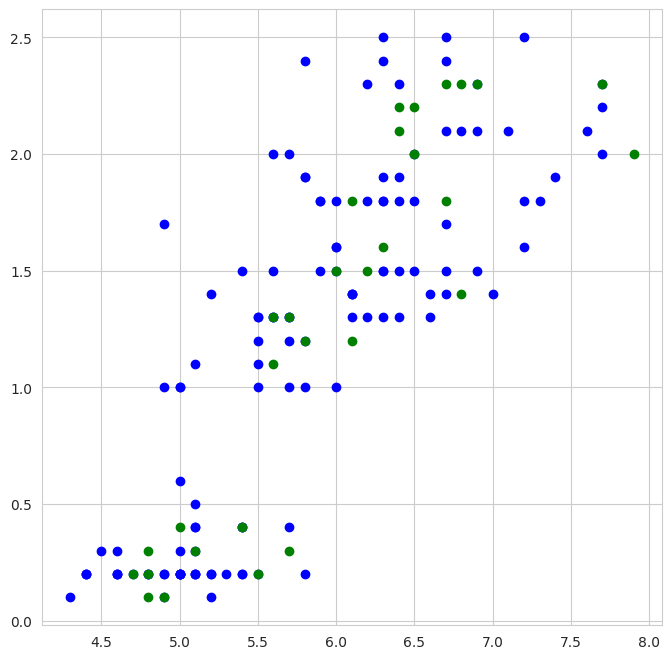

In [89]:
#con cuantos valores esta entrenando y con cuantos esta testeando
plt.scatter(X_train, y_train, color= 'b')   #entrenamiento
plt.scatter(X_test, y_test, color= 'g')  #testeo
plt.show()   #va a utilizar todos los azules para intentar predecir los verdes
#estamos hablando de una regresion lineal

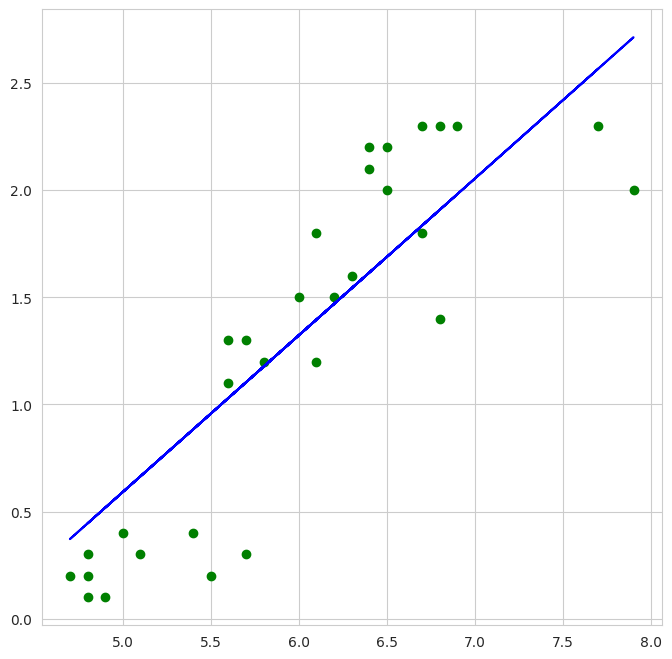

In [90]:
plt.plot(X_test, pred, color = 'b')
plt.scatter(X_test, y_test, color = 'g')
plt.show() #vemos la linea que mejor intenta ajustarse a todos los puntos de la grafica 

In [91]:
#le pido que me prediga que pasa si llega  a la grafica un valor de 9
lr.predict(np.array([[9]]))[0]

3.5187101893575505

In [92]:
from sklearn.preprocessing import MinMaxScaler  #le voy a pedir a sklearn que haga el escalamiento de los datos por medio de MinMaxScaler

In [93]:
es = MinMaxScaler() 
es.fit(allnumeric) #vamos a pedirle que es se entrene con todas nuestras variables
esc = es.transform(allnumeric) #una vez que se entrene, que haga la transformacion
esc = pd.DataFrame(esc) #todo lo que acaba de hacer le vamos a pedir que lo inserte en un nuevo dataframe partiendo de esc


In [112]:
from sklearn.decomposition import PCA #traemos PCA 
pca = PCA(n_components = 2) #que lo traiga en solo 2 componentes
e = pca.fit_transform(esc) #que entrene ese PCA

In [104]:
from sklearn.cluster import KMeans #KMeans es un metodo de agrupamiento, hace que la particion del conjunto en observaciones va a mirar cual observacion pertenece a un grupo cuyo valor medio es el mas cercano y esto pertenece a nuestro metodo de cluster
wcss= [] #lista vacia
for i in range(1, 12): #una lista donde lo agrupapos en hasta 12 componentes
  kmeans = KMeans(n_clusters = i , init = 'k-means++', random_state = 42) #que se vaya modificando en el siglo/ es una practica aconsejable agregar un random state
  kmeans.fit(e) #que se entrene pero con los valores del PSA que ya logro identificar
  wcss.append(kmeans.inertia_)  #que lo inserte en la lista vacia

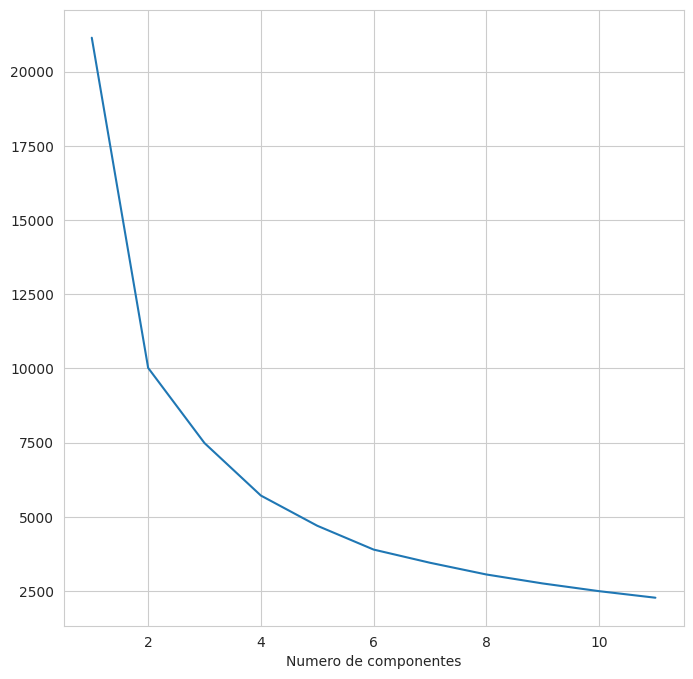

In [106]:
plt.plot(range(1,12), wcss) #rango del 1 al 12
plt.xlabel('Numero de componentes') 
plt.show() 

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

<bound method Visualizer.show of KElbowVisualizer(ax=<Axes: >, estimator=KMeans(n_clusters=11, random_state=42),
                 k=(1, 12))>

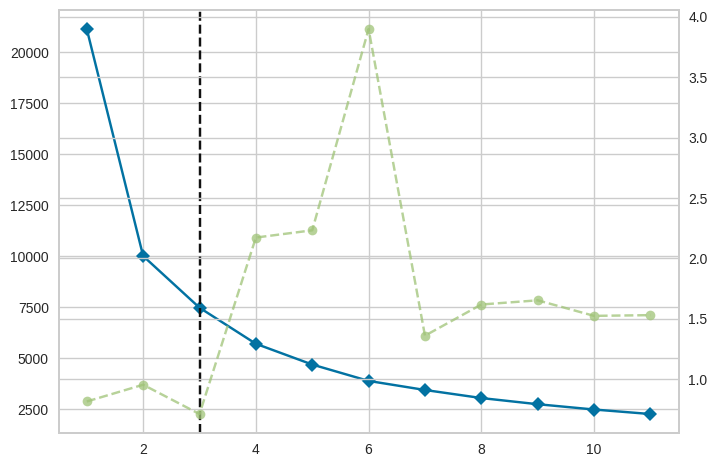

In [107]:
#implementar mas metodos para poder seleccionar el numero adecuado
#otras dos opciones para determinar si lo hace de forma adecuado

#este grafico nos dira desde donde puede funcionar esa seleccion del codo. Yellowbrick
from yellowbrick.cluster import KElbowVisualizer
visual = KElbowVisualizer(kmeans, k=(1, 12)) #q lo grafique del 1 al 12
visual.fit(e) #que nos entrene todos los elementos que tenemos entrenados por nuestro PSA
visual.show #que nos muestre todo lo que proceso

Nos dice que de 0 a 2 no nos va a servir, podriamos tomar de 2 a 8 por ejemplo 

In [127]:
pca = PCA(n_components = 8) 
e = pca.fit_transform(esc)

In [128]:
#prefiero utilizar directamente el procedimiento matematico que nos va a explicar cuanto es la descripcion de la varianza explicada por los componentes 
print("Varianza explicada por el primer componente", np.cumsum (pca.explained_variance_ratio_*100)[0] ) #varianza que explica el primer componente

#ver lo que ocurre con mas componentes 
print("Varianza explicada por los primeros dos componente", np.cumsum (pca.explained_variance_ratio_*100)[1] )
print("Varianza explicada por los primeros tres componente", np.cumsum(pca.explained_variance_ratio_*100)[2])
print("Varianza explicada por los primeros cuatro componente", np.cumsum (pca.explained_variance_ratio_*100)[3] )
print("Varianza explicada por los primeros cinco componente", np.cumsum (pca.explained_variance_ratio_*100)[4] )  #esperamos q este sea entre un 60 y 80 el resultado fianl
print("Varianza explicada por los primeros seis componente", np.cumsum (pca.explained_variance_ratio_*100)[5] ) 
print("Varianza explicada por los primeros siete componente", np.cumsum (pca.explained_variance_ratio_*100)[6] ) 
print("Varianza explicada por los primeros ocho componente", np.cumsum (pca.explained_variance_ratio_*100)[7] ) 

Varianza explicada por el primer componente 29.064535237742216
Varianza explicada por los primeros dos componente 38.33747650678145
Varianza explicada por los primeros tres componente 46.91833341197414
Varianza explicada por los primeros cuatro componente 54.62122815028248
Varianza explicada por los primeros cinco componente 61.7127007389682
Varianza explicada por los primeros seis componente 67.29821087115697
Varianza explicada por los primeros siete componente 72.24399349180396
Varianza explicada por los primeros ocho componente 76.69745128918046


In [139]:
#ver los resultados de forma grafica-decidimos que sean 8 clusters
kmenas = KMeans(n_clusters = 8, init = 'k-menas++', random_state=42)
label = kmeans.fit_predict(e)
u_labels = np.unique(label) #que nos vaya mostrando cada uno de los clusters

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



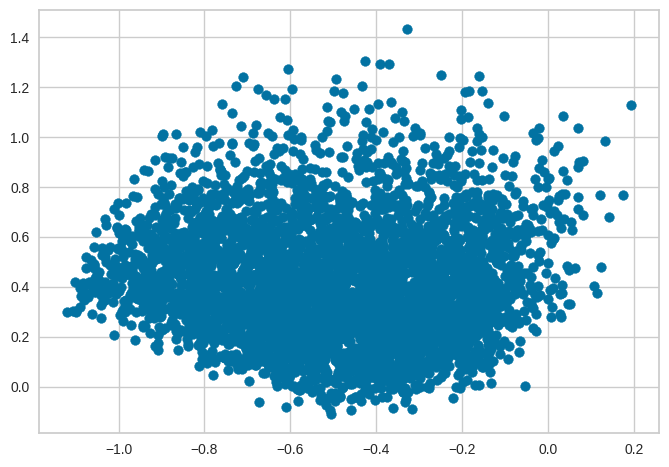

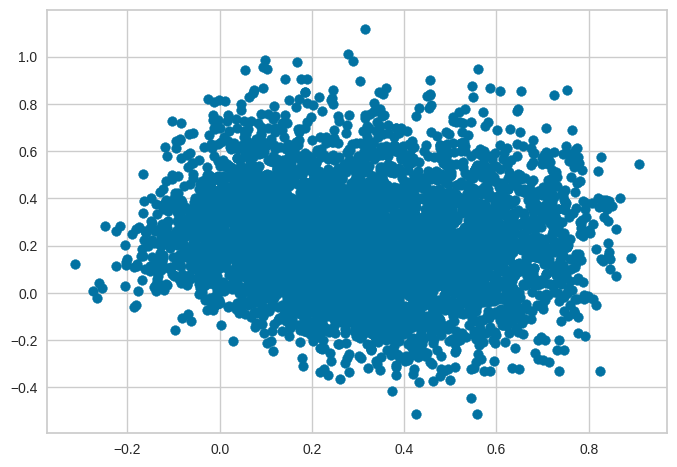

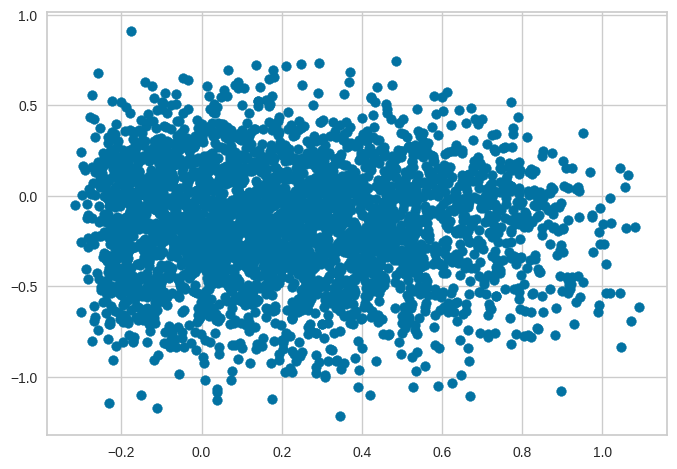

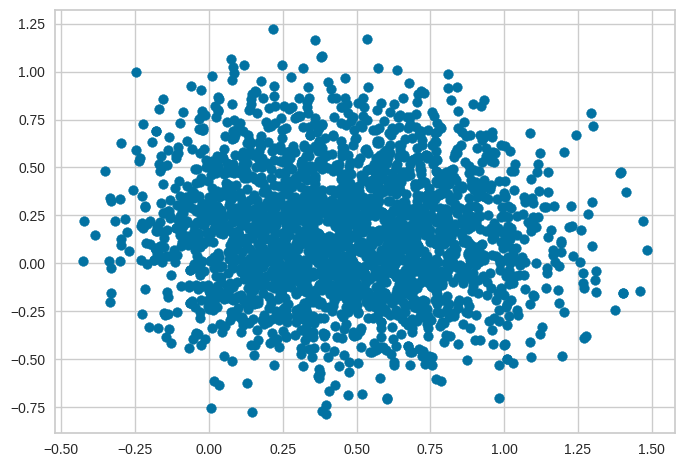

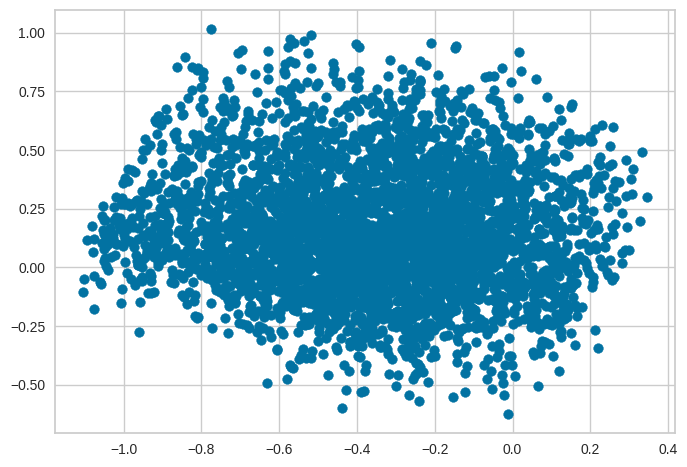

...

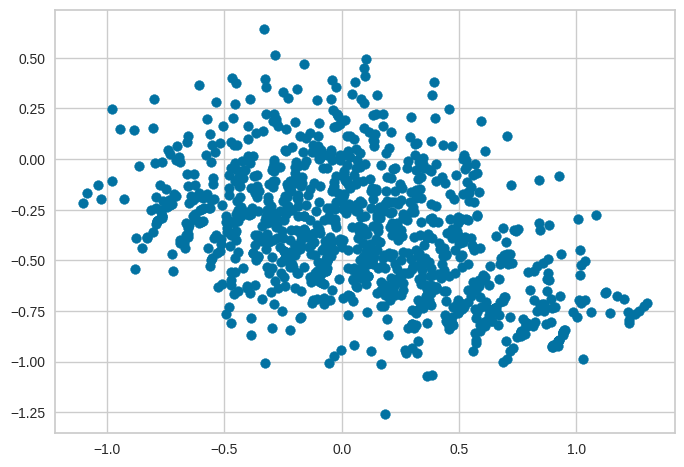

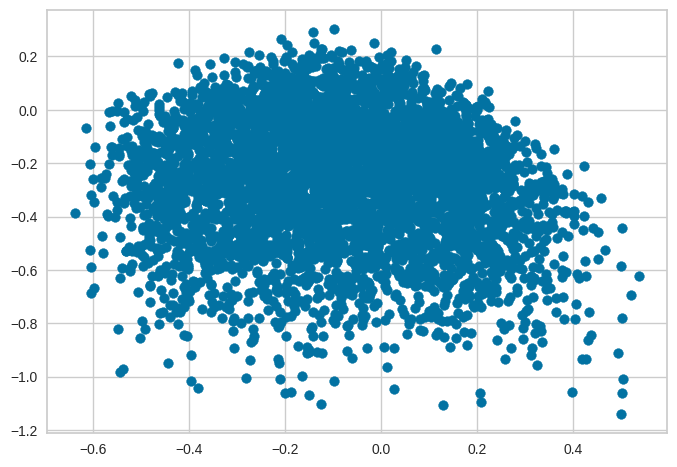

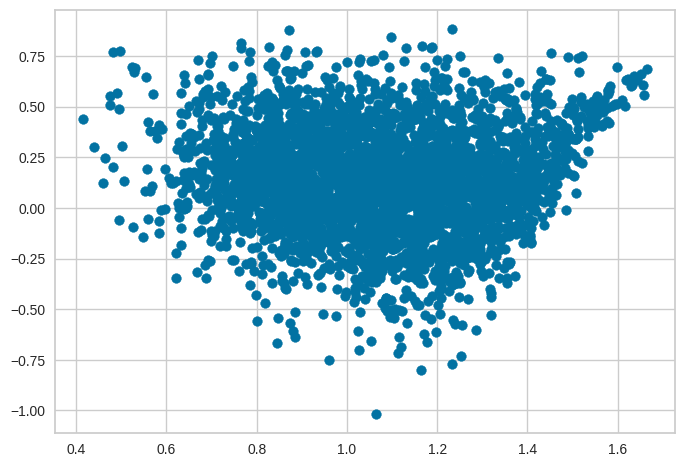

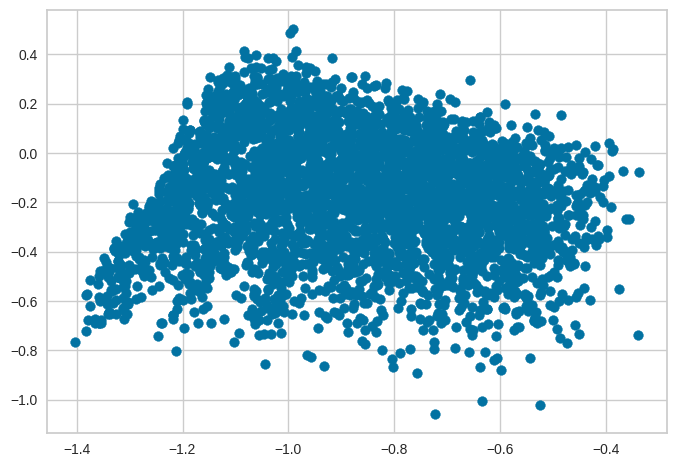

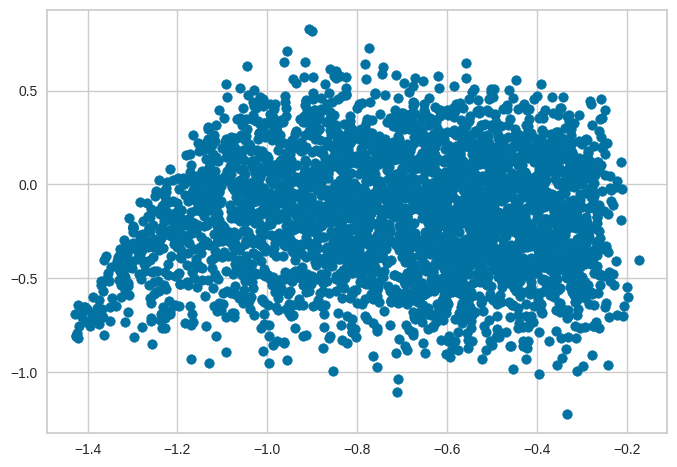

In [144]:
for i in u_labels:
  plt.scatter(e[label==i, 0], e[label == i , 1], label =i) #pedimos que nos haga un grafico
  plt.show() #quiere decir que con 8 componentes podemos representar las 19 variables

In [146]:
#APIS
#importar la libreria 
import requests

In [153]:
#ingresar a NASA API, es gratuita
url = 'https://api.nasa.gov/planetary/apod'
query = {'api_key': 'aUUvxdF6ctqMOiYICzw4WGpm9vVqKhQrgZKHc2tc'}

response = requests.get(url, params = query)
#cada API tiene sus formas de envio de datos - ver en cada documentacion 
if response.status_code==200:  #es una alerta para cuando se demora mucho o falla en nuestra solicitud
  data = response.json ()#nos va a guardar los datos en un punto json que es un formato de texto para intercambiar datos
  print("Titulo", data['title'])
  print("Descripcion", data['explanation'])
  print("Imagen", data['url']) #nos envie el link de la imagen mas importante de la nasa para el dia de hoy
  print("Dia", data['date']) #que dia hicieron esa imagen
else:
    print("Error en la API")

Titulo NGC 2419: Intergalactic Wanderer
Descripcion Stars of the globular cluster NGC 2419 are packed into this Hubble Space Telescope field of view toward the mostly stealthy constellation Lynx. The two brighter spiky stars near the edge of the frame are within our own galaxy. NGC 2419 itself is remote though, some 300,000 light-years away. In comparison, the Milky Way's satellite galaxy, the Large Magellanic Cloud, is only about 160,000 light-years distant. Roughly similar to other large globular star clusters like Omega Centauri, NGC 2419 is intrinsically bright, but appears faint because it is so far away. Its extreme distance makes it difficult to study and compare its properties with other globular clusters that roam the halo of our Milky Way galaxy. Sometimes called "the Intergalactic Wanderer", NGC 2419 really does seem to have come from beyond the Milky Way. Measurements of the cluster's motion through space suggest it once belonged to the Sagittarius dwarf spheroidal galaxy, 

In [154]:
#imgresar a API WIKIPEDIA 
#requiere una instalacion
! pip install wikipedia-api

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [163]:
import wikipediaapi

#vamos a traer un diccionario con algunos articulos de wikipedia
wiki = wikipediaapi.Wikipedia(
    language = 'es',
    extract_format = wikipediaapi.ExtractFormat.WIKI #en el formato wiki
)

page = wiki.page("Salud Mental")  #le voy a solicitar que me traiga las primeras palabras de esa pagina
page2 = wiki.page("Filosofía de la mente")

print(" Pag - Resumen %s" % page.summary[0:250])


 Pag - Resumen La salud mental es, en términos generales, el estado de equilibrio entre una persona y su entorno socio-cultural que garantiza su participación laboral, intelectual, las relaciones para alcanzar un bienestar y una buena calidad de vida. Comúnmente, s


In [165]:
#hacer un dataframe
#traemos una lista nombre y otra resumen
nombre = []
resumen = []
nombre.append(page.title[0:20])  #titulo de nuestra pagina
nombre.append(page2.title[0:40])  #que haga lo mismo con page2
resumen.append(page.summary[0:240])
resumen.append(page2.summary[0:200])

In [169]:
wiki = pd.DataFrame(nombre, resumen)
wiki = wiki.reset_index() #que nos resetee el indice
wiki = wiki.rename({'index': 'Resumen', 0 : 'Nombre'}, axis=1)
wiki

,Resumen,Nombre
0,"La salud mental es, en términos generales, el ...",Salud mental
1,La filosofía de la mente es la rama de la filo...,Filosofía de la mente
